In [2]:
# import of necessary files from other folders

import os
import sys
import ast

# libraries imports

import importlib
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import seaborn as sns
import pandas as pd
import pickle

from IPython.display import Image, display
from PIL import Image
from pathlib import Path
from scipy.integrate import solve_ivp
from matplotlib.colors import LinearSegmentedColormap,TwoSlopeNorm

# Set default figure and axes background color to white
plt.rcParams['figure.facecolor'] = 'white'  # Background for the entire figure
plt.rcParams['axes.facecolor'] = 'white' 

In [3]:
# Function to check if a string can be converted to a float or an integer
def is_number(value):
    try:
        float(value)
        return True
    except ValueError:
        return False

# import of dataframes and merging with the WM

In [9]:
df_complete=pd.read_pickle('path to df_sr.pkl')

## visualize failed networks

In [10]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_null_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_null = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] == 0)
    return num_null
    
df_space['connectivity']=df_space['A'].apply(lambda x: 1-count_null_entries(x)/56)
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_pos_neg_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    num_positive = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] > 0)
    num_negative = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] < 0)
    return [num_positive, num_negative]

# Apply the function to the 'A' column and create a new column 'pos_neg_counts'
df_space['pos_neg_counts'] =df_space['A'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive values (fraction_pos) and fraction of negative values (fraction_neg)
df_space['fraction_pos'] = df_space.apply(
    lambda row: row['pos_neg_counts'][0] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)
df_space['fraction_neg'] = df_space.apply(
    lambda row: row['pos_neg_counts'][1] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)

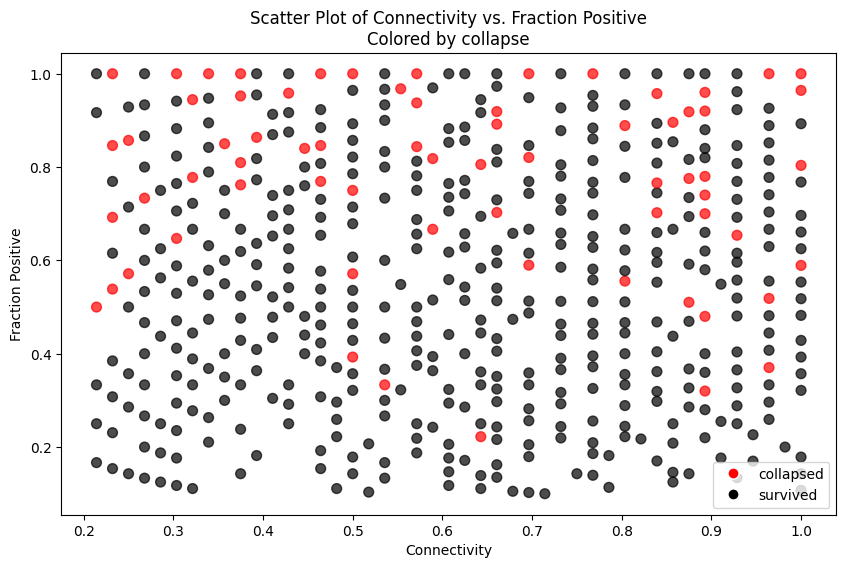

In [11]:
# Define color mapping based on the 'R_cr' column
colors = np.where(df_space['R_sp'].apply(lambda x: isinstance(x, str) and x == 'no'), 'red', 'black')

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(
    x=df_space['connectivity'], 
    y=df_space['fraction_pos'], 
    c=colors,  # Use the color mapping for the points
    s=50,      # Adjust the size of points if necessary
    alpha=0.7  # Transparency to handle overlapping points
)

# Label axes
plt.xlabel("Connectivity")
plt.ylabel("Fraction Positive")
plt.title("Scatter Plot of Connectivity vs. Fraction Positive\nColored by collapse")

# Add a legend for colors
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='collapsed'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='survived'),
]
plt.legend(handles=legend_elements)

plt.show()

In [12]:
colors = np.where(df_space['R_sp'].apply(lambda x: isinstance(x, str) and x == 'no'), 'red', 'black')

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_space['mean_off_diag'] = df_space['A'].apply(calculate_off_diag_mean)
df_space['std_A'] = df_space['A'].apply(calculate_std)

# Function to calculate average correlation between a_ij and a_ji
def calculate_avg_correlation(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    i_indices, j_indices = np.triu_indices_from(matrix, k=1)  # Indices for upper triangle (non-diagonal)
    a_ij = matrix[i_indices, j_indices]  # Extract upper triangle values
    a_ji = matrix[j_indices, i_indices]  # Extract corresponding lower triangle values
    return np.corrcoef(a_ij, a_ji)[0, 1]  # Correlation coefficient

# Function to calculate variance of the g vector
def calculate_variance(vector):
    vector = np.array(vector)  # Ensure it's a NumPy array
    return np.var(vector)

# Assuming df_space['A'] contains the matrices and df_space['g'] contains the vectors
df_space['avg_correlation'] = df_space['A'].apply(calculate_avg_correlation)
df_space['variance_g'] = df_space['g0'].apply(calculate_variance)

## keep going with successfull

In [13]:
df_complete = df_space[df_space['R_sp'].apply(lambda x: not (isinstance(x, str) and x == 'no'))]

In [14]:
len(df_complete)

431

## Visualize 50 random grids

In [15]:
# choose 100 random to plot compared
import random

np.random.seed(42)
indexes_random = random.sample(list(df_complete.index), 50)

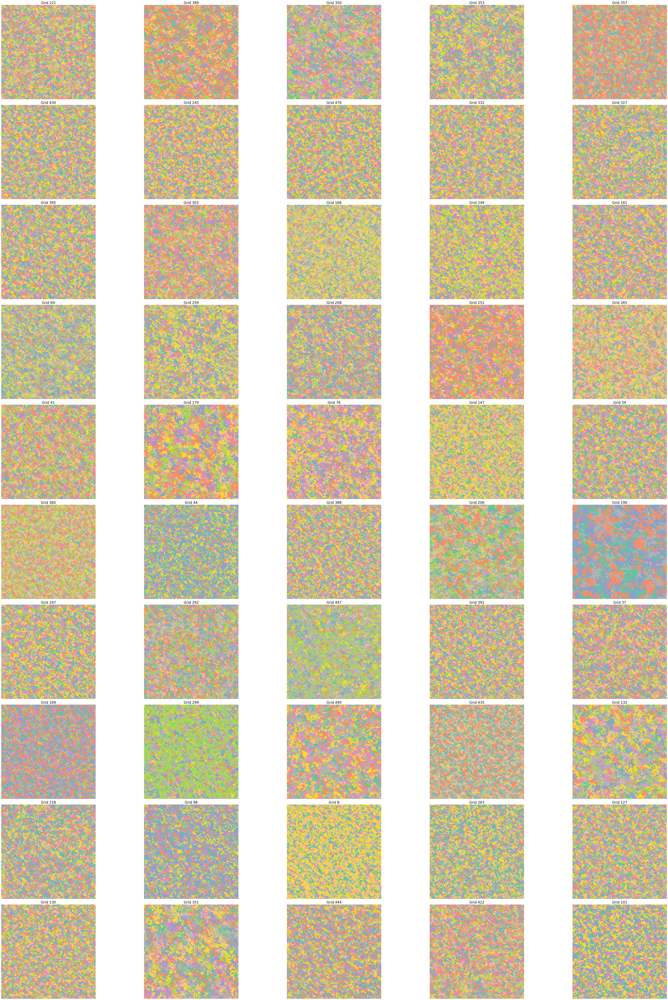

In [16]:
from matplotlib.colors import ListedColormap, BoundaryNorm

# Assuming `df_complete` and `indexes_random` are defined earlier in your code
# Extract the matrices for time_series and LV_traj
grids = [np.argmax(np.array(df_complete['grid_sp'].loc[i]), axis=2) for i in indexes_random]

# Define the custom colormap matching the colors for species
species_colors = plt.get_cmap('Set2').colors[:8]  # Ensure you have 8 colors
cmap = ListedColormap(species_colors)
norm = BoundaryNorm(np.arange(9) - 0.5, 8)

# Create a figure with subplots for each of the matrices (10 rows, 5 columns)
fig, axes = plt.subplots(10, 5, figsize=(60, 80))  # Adjusted figsize for more columns

# Loop over the axes and the matrices to plot
for idx, ax_grid in enumerate(axes.flatten()):
    if idx < len(grids):
        # Plot the grid for this index
        im = ax_grid.imshow(np.array(grids[idx]), cmap=cmap, norm=norm, interpolation='None')
        
        # Add the index `i` as a title
        ax_grid.set_title(f"Grid {indexes_random[idx]}", fontsize=20)
        
        # Hide axis ticks and labels
        ax_grid.axis('off')
    else:
        # If there are more subplots than grids, hide the unused axes
        ax_grid.axis('off')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Compare wm and spatial CR

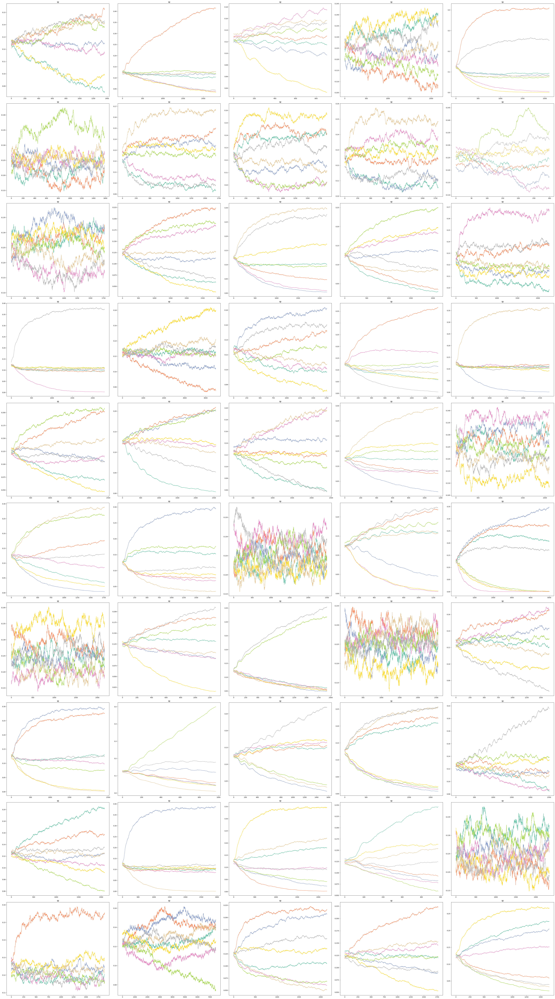

In [17]:

# Extract the matrices for time_series and LV_traj
cr_matrices = [df_complete['CR_N'].loc[i] for i in indexes_random]
lv_matrices = [df_complete['LV'].loc[i] for i in indexes_random]
sp_matrices = [df_complete['N_sp'].loc[i] for i in indexes_random]


# Create a figure with subplots for each of the matrices (23 rows, 20 columns)
fig, axes = plt.subplots(10, 5, figsize=(50, 90))  # Adjusted figsize for more columns

# Loop over the axes and the matrices to plot
for idx, ax_sp in enumerate(axes.flatten()):
    
    # Get the colors for each species based on the index
    species_colors_time_series = plt.cm.Set2.colors[:8]

    # Plot sp
    for i, color in enumerate(species_colors_time_series):
        ax_sp.plot(np.array(sp_matrices[idx])[:,i], color=color, label=f'Species {i + 1}')
    ax_sp.set_title('sp')
    ax_sp.axis('on')  # Hide axis

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Plot diversity time series

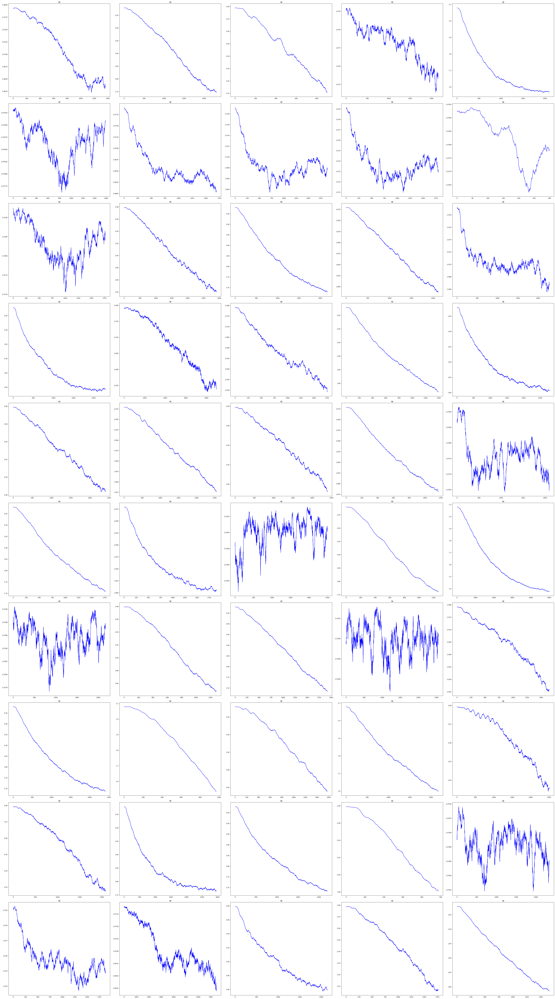

In [18]:
sp_matrices = [df_complete['sh_sp'].loc[i] for i in indexes_random]


# Create a figure with subplots for each of the matrices (23 rows, 20 columns)
fig, axes = plt.subplots(10, 5, figsize=(50, 90))  # Adjusted figsize for more columns

# Loop over the axes and the matrices to plot
for idx, ax_sp in enumerate(axes.flatten()):
    
    # Get the colors for each species based on the index
    species_colors_time_series = plt.cm.Set2.colors[:8]

    # Plot sp
    ax_sp.plot(np.array(sp_matrices[idx]), color='blue', label=f'Species {i + 1}')
    ax_sp.set_title('sp')
    ax_sp.axis('on')  # Hide axis

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Compare

In [19]:
df_complete['shannon_sp']=df_complete['sh_sp'].apply(lambda x: x[-1])

/tmp/ipykernel_3909714/1661567816.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['shannon_sp']=df_complete['sh_sp'].apply(lambda x: x[-1])


In [20]:
from scipy.stats import entropy

# Apply the function to compute Shannon diversity and add it as a new column
df_complete['shannon'] = df_complete['CR_N'].apply(lambda x: entropy(x[0][-1], base=np.e))

/tmp/ipykernel_3909714/1931936872.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['shannon'] = df_complete['CR_N'].apply(lambda x: entropy(x[0][-1], base=np.e))


In [21]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_null_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_null = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] == 0)
    return num_null
    
df_complete['connectivity']=df_complete['A'].apply(lambda x: 1-count_null_entries(x)/56)


/tmp/ipykernel_3909714/2306347580.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['connectivity']=df_complete['A'].apply(lambda x: 1-count_null_entries(x)/56)


In [22]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_pos_neg_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    num_positive = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] > 0)
    num_negative = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] < 0)
    return [num_positive, num_negative]

# Apply the function to the 'A' column and create a new column 'pos_neg_counts'
df_complete['pos_neg_counts'] =df_complete['A'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive values (fraction_pos) and fraction of negative values (fraction_neg)
df_complete['fraction_pos'] = df_complete.apply(
    lambda row: row['pos_neg_counts'][0] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)
df_complete['fraction_neg'] = df_complete.apply(
    lambda row: row['pos_neg_counts'][1] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)

/tmp/ipykernel_3909714/1157920440.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['pos_neg_counts'] =df_complete['A'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))
/tmp/ipykernel_3909714/1157920440.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['fraction_pos'] = df_complete.apply(
/tmp/ipykernel_3909714/1157920440.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

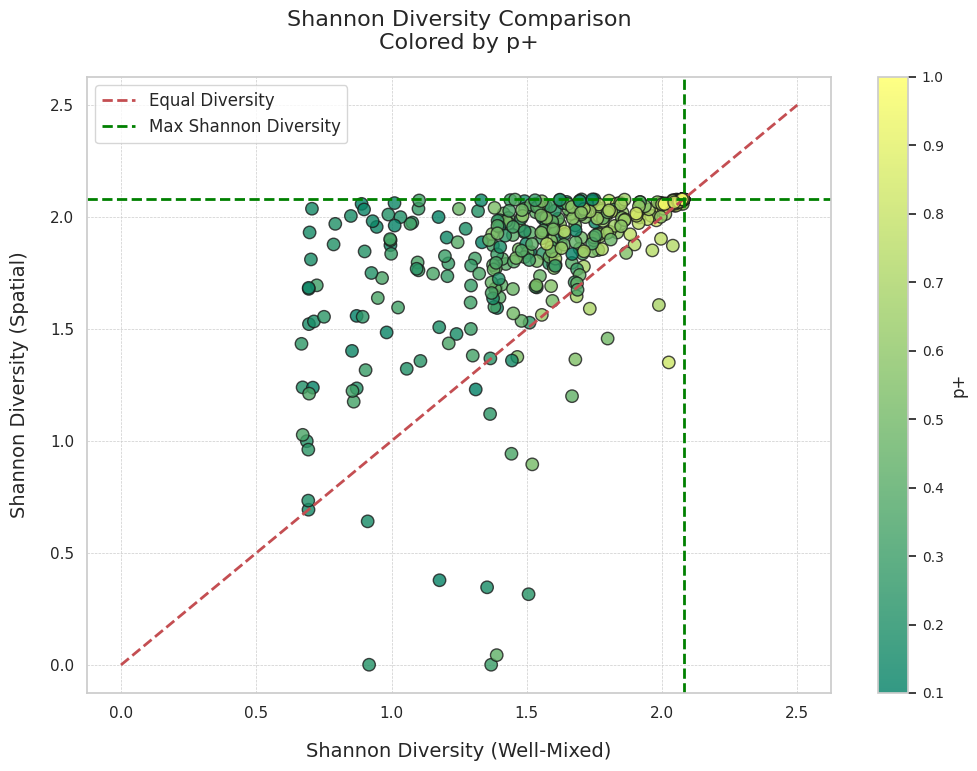

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['fraction_pos'],  # Color based on normalized competition
    cmap='summer',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.8                      # Transparency for better visualization
)

# Add a color bar to indicate the competition values
cbar = plt.colorbar(sc)
cbar.set_label('p+', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by p+', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

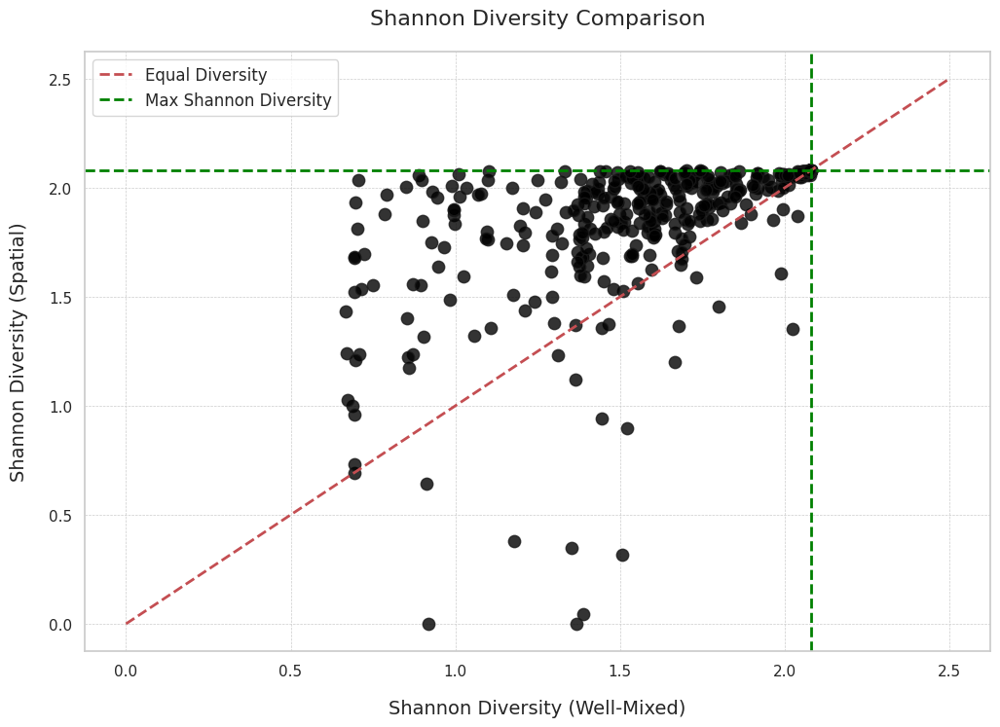

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c='black',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.8                      # Transparency for better visualization
)



# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

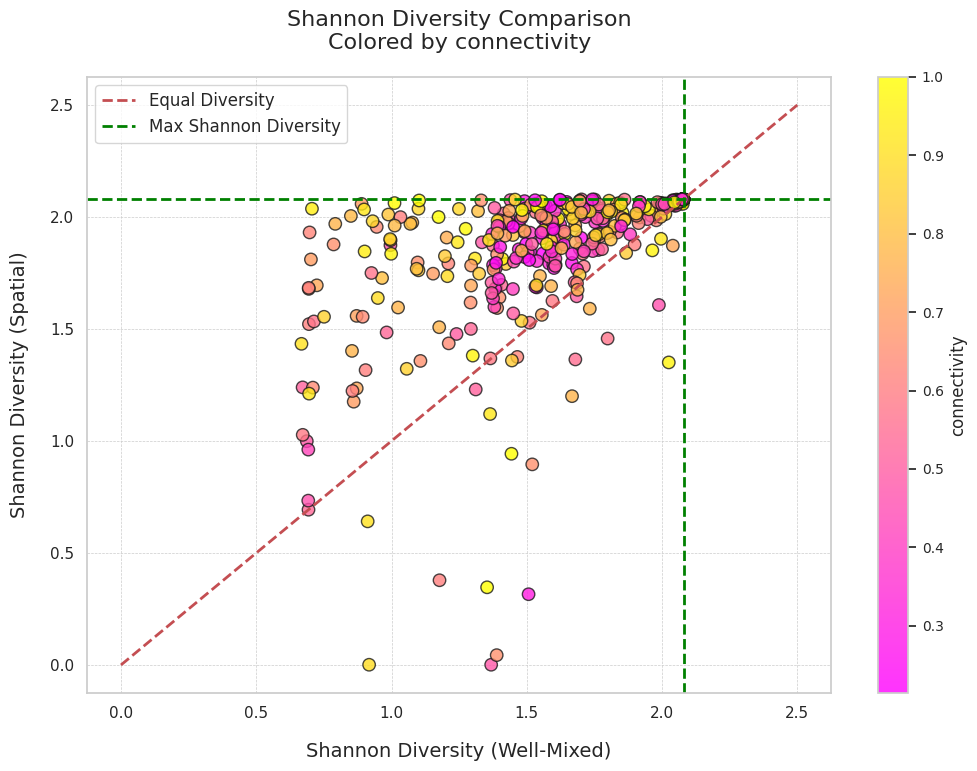

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['connectivity'],  # Color based on normalized competition
    cmap='spring',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.8                      # Transparency for better visualization
)

# Add a color bar to indicate the competition values
cbar = plt.colorbar(sc)
cbar.set_label('connectivity', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by connectivity', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

In [26]:

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_complete['mean_off_diag'] = df_complete['A'].apply(calculate_off_diag_mean)
df_complete['std_A'] = df_complete['A'].apply(calculate_std)

# Function to calculate average correlation between a_ij and a_ji
def calculate_avg_correlation(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    i_indices, j_indices = np.triu_indices_from(matrix, k=1)  # Indices for upper triangle (non-diagonal)
    a_ij = matrix[i_indices, j_indices]  # Extract upper triangle values
    a_ji = matrix[j_indices, i_indices]  # Extract corresponding lower triangle values
    return np.corrcoef(a_ij, a_ji)[0, 1]  # Correlation coefficient

# Function to calculate variance of the g vector
def calculate_variance(vector):
    vector = np.array(vector)  # Ensure it's a NumPy array
    return np.var(vector)

# Assuming df_space['A'] contains the matrices and df_space['g'] contains the vectors
df_complete['avg_correlation'] = df_complete['A'].apply(calculate_avg_correlation)
df_complete['variance_g'] = df_complete['g0'].apply(calculate_variance)

/tmp/ipykernel_3909714/1162777138.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['mean_off_diag'] = df_complete['A'].apply(calculate_off_diag_mean)
/tmp/ipykernel_3909714/1162777138.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['std_A'] = df_complete['A'].apply(calculate_std)
/tmp/ipykernel_3909714/1162777138.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

/tmp/ipykernel_3909714/1113057095.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['A/var(g)']=df_complete['A'].apply(np.abs).apply(np.mean)/df_complete['variance_g']
/tmp/ipykernel_3909714/1113057095.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_

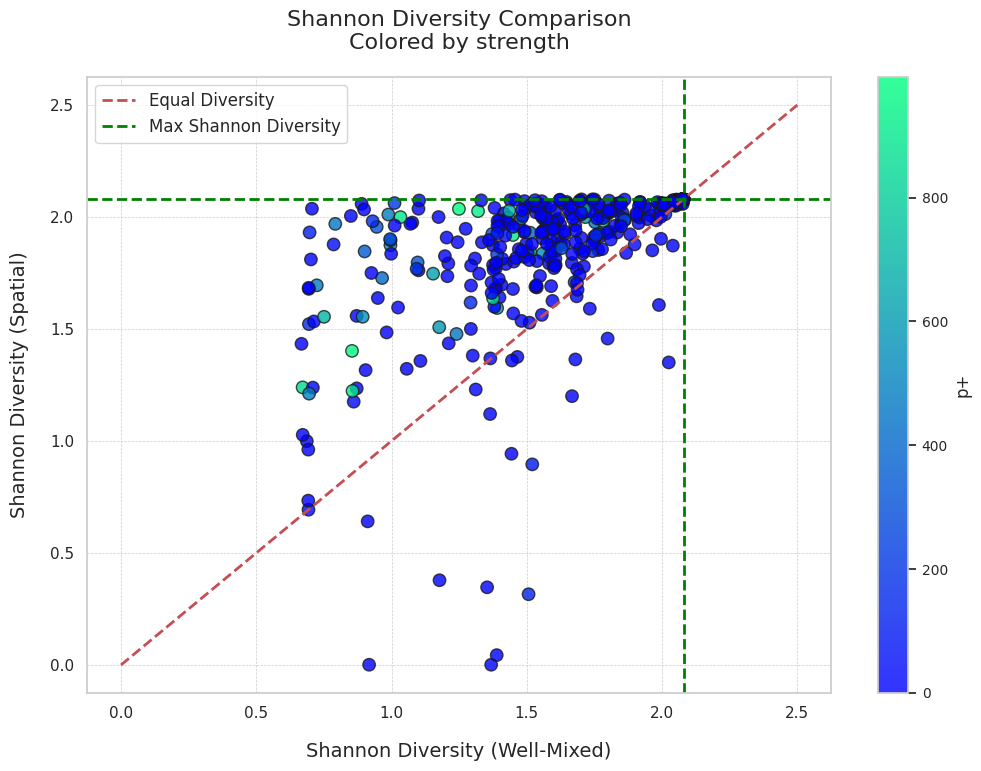

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df_complete['A/var(g)']=df_complete['A'].apply(np.abs).apply(np.mean)/df_complete['variance_g']
df_complete['A/var(g)'][df_complete['A/var(g)']>1000]=0

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['A/var(g)'],  # Color based on normalized competition
    cmap='winter',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.8                      # Transparency for better visualization
)

# Add a color bar to indicate the competition values
cbar = plt.colorbar(sc)
cbar.set_label('p+', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by strength', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

In [28]:

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_complete['mean_off_diag'] = df_complete['A'].apply(calculate_off_diag_mean)
df_complete['std_A'] = df_complete['A'].apply(calculate_std)
# Function to calculate average correlation between a_ij and a_ji
def calculate_avg_correlation(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    i_indices, j_indices = np.triu_indices_from(matrix, k=1)  # Indices for upper triangle (non-diagonal)
    a_ij = matrix[i_indices, j_indices]  # Extract upper triangle values
    a_ji = matrix[j_indices, i_indices]  # Extract corresponding lower triangle values
    return np.corrcoef(a_ij, a_ji)[0, 1]  # Correlation coefficient

# Function to calculate variance of the g vector
def calculate_variance(vector):
    vector = np.array(vector)  # Ensure it's a NumPy array
    return np.var(vector)

# Assuming df_filtered['A'] contains the matrices and df_filtered['g'] contains the vectors
df_complete['avg_correlation'] = df_complete['A'].apply(calculate_avg_correlation)
df_complete['variance_g'] = df_complete['g0'].apply(calculate_variance)

/tmp/ipykernel_3909714/2551380576.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['mean_off_diag'] = df_complete['A'].apply(calculate_off_diag_mean)
/tmp/ipykernel_3909714/2551380576.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['std_A'] = df_complete['A'].apply(calculate_std)
/tmp/ipykernel_3909714/2551380576.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

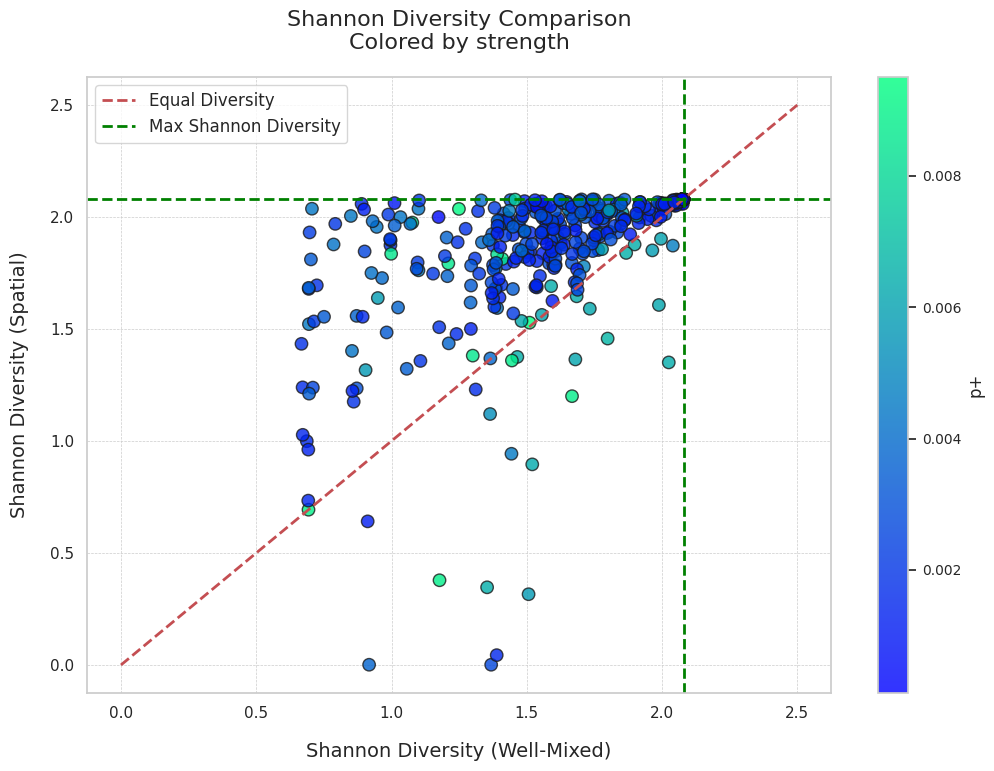

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['std_A'],  # Color based on normalized competition
    cmap='winter',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.8                      # Transparency for better visualization
)

# Add a color bar to indicate the competition values
cbar = plt.colorbar(sc)
cbar.set_label('p+', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by strength', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

/tmp/ipykernel_3909714/1096917763.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['p-_bin'] = pd.cut(df_complete['fraction_neg'], bins=x_bins, labels=False)
/tmp/ipykernel_3909714/1096917763.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['p_int_bin'] = pd.cut(df_complete['connectivity'], bins=y_bins, labels=False)


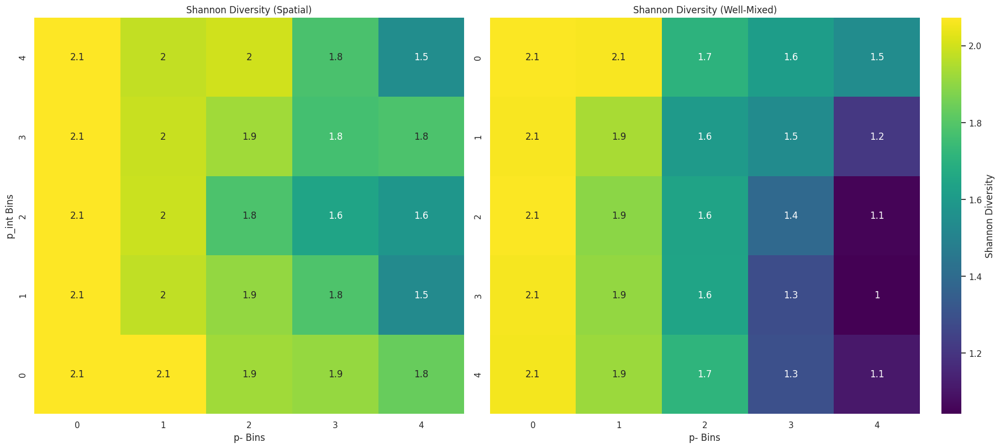

In [30]:
# Define the number of bins for 'p-' and 'p_int'
x_bins = 5  # Number of bins for 'p-'
y_bins = 5  # Number of bins for 'p_int'

# Create bins for 'p-' and 'p_int'
df_complete['p-_bin'] = pd.cut(df_complete['fraction_neg'], bins=x_bins, labels=False)
df_complete['p_int_bin'] = pd.cut(df_complete['connectivity'], bins=y_bins, labels=False)

# Aggregate data for 'shannon_sp'
df_aggregated_sp = df_complete.groupby(['p-_bin', 'p_int_bin'])['shannon_sp'].mean().reset_index()
pivot_table_sp = df_aggregated_sp.pivot(index='p_int_bin', columns='p-_bin', values='shannon_sp')

# Aggregate data for 'shannon'
df_aggregated_wm = df_complete.groupby(['p-_bin', 'p_int_bin'])['shannon'].mean().reset_index()
pivot_table_wm = df_aggregated_wm.pivot(index='p_int_bin', columns='p-_bin', values='shannon')

# Set up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(18, 8), constrained_layout=True)

# Get the color range across both datasets
vmin = min(pivot_table_sp.min().min(), pivot_table_wm.min().min())
vmax = max(pivot_table_sp.max().max(), pivot_table_wm.max().max())

# Plot the heatmaps
sns.heatmap(pivot_table_sp, annot=True, cmap='viridis', ax=axes[0], vmin=vmin, vmax=vmax, cbar=False)
axes[0].set_title('Shannon Diversity (Spatial)')
axes[0].set_xlabel('p- Bins')
axes[0].set_ylabel('p_int Bins')
axes[0].invert_yaxis()

sns.heatmap(pivot_table_wm, annot=True, cmap='viridis', ax=axes[1], vmin=vmin, vmax=vmax, cbar=True, cbar_kws={'label': 'Shannon Diversity'})
axes[1].set_title('Shannon Diversity (Well-Mixed)')
axes[1].set_xlabel('p- Bins')
axes[1].set_ylabel('')

# Adjust layout and show the plot
plt.show()

# Statistics

/tmp/ipykernel_3909714/307454879.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['fraction_pos_binned'] = pd.cut(df_complete['fraction_pos'], bins=n_bins)


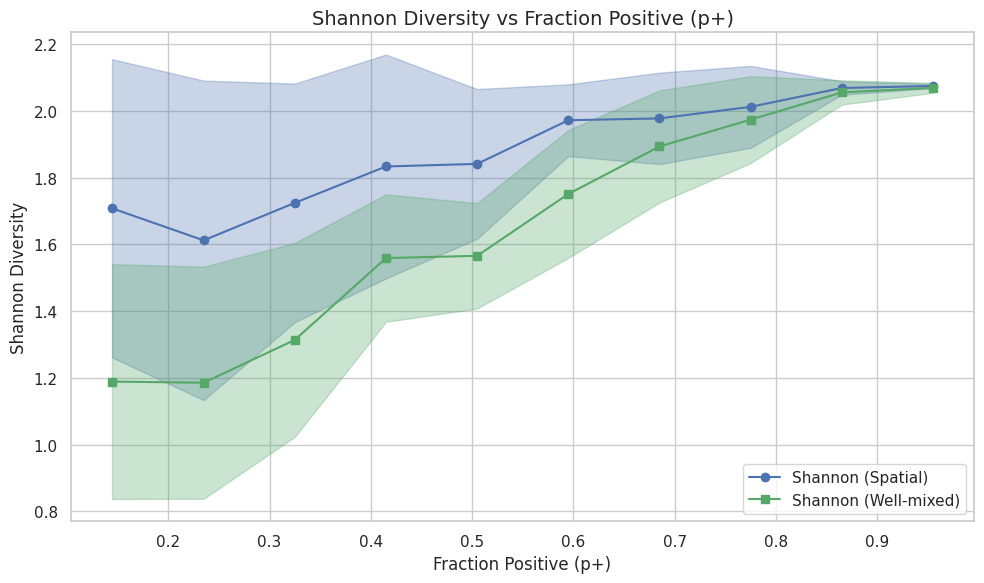

In [31]:
# Bin the fraction_pos (p+) values into 10 bins
n_bins = 10
df_complete['fraction_pos_binned'] = pd.cut(df_complete['fraction_pos'], bins=n_bins)

# Create empty lists to store the binned average values and their errors
binned_shannon_sp_avg = []
binned_shannon_avg = []
binned_shannon_sp_std = []
binned_shannon_std = []
binned_fraction_pos = []

# Iterate over each bin, calculating averages and standard deviations
for bin_range in df_complete['fraction_pos_binned'].unique():
    # Get the data for the current bin
    bin_data = df_complete[df_complete['fraction_pos_binned'] == bin_range]
    
    # Calculate the average and standard deviation for shannon_sp and shannon
    binned_shannon_sp_avg.append(bin_data['shannon_sp'].mean())
    binned_shannon_avg.append(bin_data['shannon'].mean())
    binned_shannon_sp_std.append(bin_data['shannon_sp'].std())
    binned_shannon_std.append(bin_data['shannon'].std())
    
    # Append the midpoint of the bin range for plotting on the x-axis
    binned_fraction_pos.append(bin_range.mid)

# Convert lists into numpy arrays for plotting
binned_shannon_sp_avg = np.array(binned_shannon_sp_avg)
binned_shannon_avg = np.array(binned_shannon_avg)
binned_shannon_sp_std = np.array(binned_shannon_sp_std)
binned_shannon_std = np.array(binned_shannon_std)
binned_fraction_pos = np.array(binned_fraction_pos)

# Sort the values by binned_fraction_pos to ensure the plot is ordered
sorted_indices = np.argsort(binned_fraction_pos)
binned_fraction_pos = binned_fraction_pos[sorted_indices]
binned_shannon_sp_avg = binned_shannon_sp_avg[sorted_indices]
binned_shannon_avg = binned_shannon_avg[sorted_indices]
binned_shannon_sp_std = binned_shannon_sp_std[sorted_indices]
binned_shannon_std = binned_shannon_std[sorted_indices]

# Plot the results
plt.figure(figsize=(10, 6))

# Plot the average Shannon diversity for shannon_sp and shannon with shaded error regions
plt.plot(binned_fraction_pos, binned_shannon_sp_avg, label='Shannon (Spatial)', color='b', marker='o')
plt.fill_between(binned_fraction_pos, binned_shannon_sp_avg - binned_shannon_sp_std, 
                 binned_shannon_sp_avg + binned_shannon_sp_std, color='b', alpha=0.3)

plt.plot(binned_fraction_pos, binned_shannon_avg, label='Shannon (Well-mixed)', color='g', marker='s')
plt.fill_between(binned_fraction_pos, binned_shannon_avg - binned_shannon_std, 
                 binned_shannon_avg + binned_shannon_std, color='g', alpha=0.3)

# Add labels and title
plt.xlabel('Fraction Positive (p+)', fontsize=12)
plt.ylabel('Shannon Diversity', fontsize=12)
plt.title('Shannon Diversity vs Fraction Positive (p+)', fontsize=14)

# Add legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_3909714/1613082578.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['fraction_pos_binned'] = pd.cut(df_complete['connectivity'], bins=n_bins)


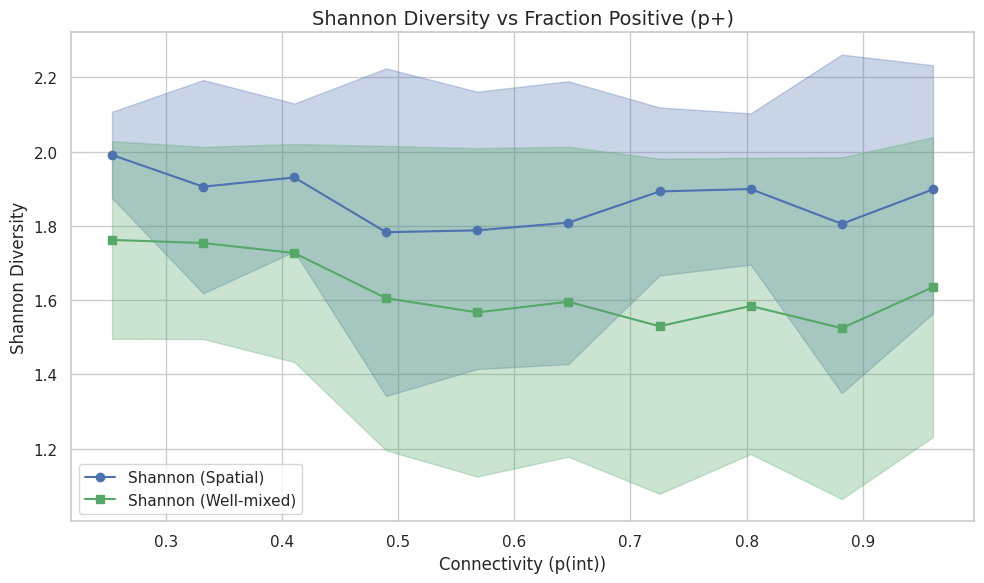

In [32]:
# Bin the fraction_pos (p+) values into 10 bins
n_bins = 10
df_complete['fraction_pos_binned'] = pd.cut(df_complete['connectivity'], bins=n_bins)

# Create empty lists to store the binned average values and their errors
binned_shannon_sp_avg = []
binned_shannon_avg = []
binned_shannon_sp_std = []
binned_shannon_std = []
binned_fraction_pos = []

# Iterate over each bin, calculating averages and standard deviations
for bin_range in df_complete['fraction_pos_binned'].unique():
    # Get the data for the current bin
    bin_data = df_complete[df_complete['fraction_pos_binned'] == bin_range]
    
    # Calculate the average and standard deviation for shannon_sp and shannon
    binned_shannon_sp_avg.append(bin_data['shannon_sp'].mean())
    binned_shannon_avg.append(bin_data['shannon'].mean())
    binned_shannon_sp_std.append(bin_data['shannon_sp'].std())
    binned_shannon_std.append(bin_data['shannon'].std())
    
    # Append the midpoint of the bin range for plotting on the x-axis
    binned_fraction_pos.append(bin_range.mid)

# Convert lists into numpy arrays for plotting
binned_shannon_sp_avg = np.array(binned_shannon_sp_avg)
binned_shannon_avg = np.array(binned_shannon_avg)
binned_shannon_sp_std = np.array(binned_shannon_sp_std)
binned_shannon_std = np.array(binned_shannon_std)
binned_fraction_pos = np.array(binned_fraction_pos)

# Sort the values by binned_fraction_pos to ensure the plot is ordered
sorted_indices = np.argsort(binned_fraction_pos)
binned_fraction_pos = binned_fraction_pos[sorted_indices]
binned_shannon_sp_avg = binned_shannon_sp_avg[sorted_indices]
binned_shannon_avg = binned_shannon_avg[sorted_indices]
binned_shannon_sp_std = binned_shannon_sp_std[sorted_indices]
binned_shannon_std = binned_shannon_std[sorted_indices]

# Plot the results
plt.figure(figsize=(10, 6))

# Plot the average Shannon diversity for shannon_sp and shannon with shaded error regions
plt.plot(binned_fraction_pos, binned_shannon_sp_avg, label='Shannon (Spatial)', color='b', marker='o')
plt.fill_between(binned_fraction_pos, binned_shannon_sp_avg - binned_shannon_sp_std, 
                 binned_shannon_sp_avg + binned_shannon_sp_std, color='b', alpha=0.3)

plt.plot(binned_fraction_pos, binned_shannon_avg, label='Shannon (Well-mixed)', color='g', marker='s')
plt.fill_between(binned_fraction_pos, binned_shannon_avg - binned_shannon_std, 
                 binned_shannon_avg + binned_shannon_std, color='g', alpha=0.3)

# Add labels and title
plt.xlabel('Connectivity (p(int))', fontsize=12)
plt.ylabel('Shannon Diversity', fontsize=12)
plt.title('Shannon Diversity vs Fraction Positive (p+)', fontsize=14)

# Add legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [33]:
df_complete['time']=df_complete['N_sp'].apply(len)

/tmp/ipykernel_3909714/569284721.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['time']=df_complete['N_sp'].apply(len)


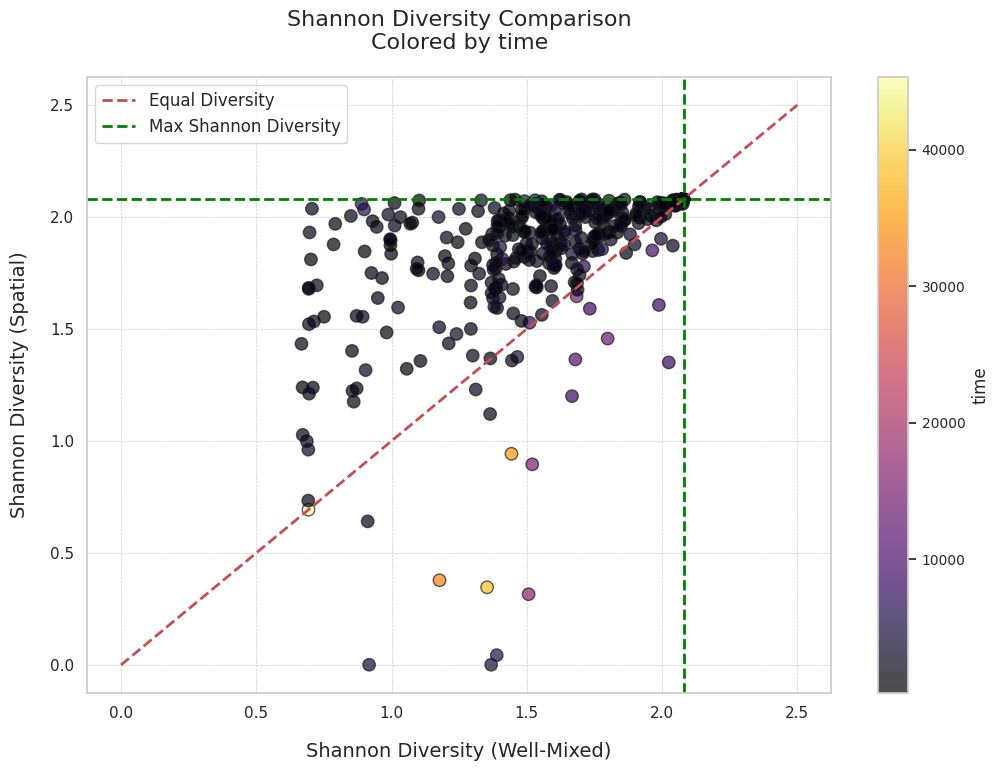

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['time'],  # Color based on normalized competition
    cmap='inferno',                # Colormap for the competition values
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar to indicate the competition values
cbar = plt.colorbar(sc)
cbar.set_label('time', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by time', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

## Enrichment

In [35]:
df_complete['surv_vec']=df_complete['CR_N'].apply(lambda x: np.where(x[0][-1]/np.sum(x[0][-1])>0.05,1,0))
df_complete['surv_vec_sp']=df_complete['N_sp'].apply(lambda x: np.where(x[-1]/np.sum(x[-1])>0.05,1,0))
df_complete['richness']=df_complete['surv_vec'].apply(np.sum)
df_complete['richness_sp']=df_complete['surv_vec_sp'].apply(np.sum)

/tmp/ipykernel_3909714/131462485.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['surv_vec']=df_complete['CR_N'].apply(lambda x: np.where(x[0][-1]/np.sum(x[0][-1])>0.05,1,0))
/tmp/ipykernel_3909714/131462485.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['surv_vec_sp']=df_complete['N_sp'].apply(lambda x: np.where(x[-1]/np.sum(x[-1])>0.05,1,0))
/tmp/ipykernel_3909714/131462485.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

In [36]:
# calculate final A in wm and space
def modify_A_wm(row):
    A = row['A'].copy()
    surv_vec = row['surv_vec'].copy()
    
    # Create a mask for extinct species (0 in surv_vec)
    surv_mask = surv_vec == 1
    
    # Set rows and columns corresponding to extinct species to zero
    A[~surv_mask, :] = 0  # Set rows of extinct species to zero
    A[:, ~surv_mask] = 0  # Set columns of extinct species to zero
    
    return A

# Apply the function row-wise to create the 'A_fin_wm' column
df_complete['A_fin_wm'] = df_complete.apply(modify_A_wm, axis=1)

# calculate final A in wm and space
def modify_A_sp(row):
    A = row['A'].copy()
    surv_vec = row['surv_vec_sp'].copy()
    
    # Create a mask for extinct species (0 in surv_vec)
    surv_mask = surv_vec == 1
    
    # Set rows and columns corresponding to extinct species to zero
    A[~surv_mask, :] = 0  # Set rows of extinct species to zero
    A[:, ~surv_mask] = 0  # Set columns of extinct species to zero
    
    return A

# Apply the function row-wise to create the 'A_fin_wm' column
df_complete['A_fin_sp'] = df_complete.apply(modify_A_sp, axis=1)

/tmp/ipykernel_3909714/219216020.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['A_fin_wm'] = df_complete.apply(modify_A_wm, axis=1)
/tmp/ipykernel_3909714/219216020.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['A_fin_sp'] = df_complete.apply(modify_A_sp, axis=1)


In [37]:
df_complete['connectivity_fin_wm']=df_complete['A_fin_wm'].apply(lambda x: 1-count_null_entries(x)/56)
df_complete['connectivity_fin_sp']=df_complete['A_fin_sp'].apply(lambda x: 1-count_null_entries(x)/56)

/tmp/ipykernel_3909714/3547843364.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['connectivity_fin_wm']=df_complete['A_fin_wm'].apply(lambda x: 1-count_null_entries(x)/56)
/tmp/ipykernel_3909714/3547843364.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['connectivity_fin_sp']=df_complete['A_fin_sp'].apply(lambda x: 1-count_null_entries(x)/56)


In [38]:
# Apply the function to the 'A' column and create a new column 'pos_neg_counts'
df_complete['pos_neg_counts_fin_wm'] =df_complete['A_fin_wm'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive values (fraction_pos) and fraction of negative values (fraction_neg)
df_complete['fraction_pos_fin_wm'] = df_complete.apply(
    lambda row: row['pos_neg_counts_fin_wm'][0] / (row['pos_neg_counts_fin_wm'][0]+row['pos_neg_counts_fin_wm'][1]) if row['connectivity_fin_wm'] != 0 else np.nan, 
    axis=1
)
df_complete['fraction_neg_fin_wm'] = df_complete.apply(
    lambda row: row['pos_neg_counts_fin_wm'][1] / (row['pos_neg_counts_fin_wm'][0]+row['pos_neg_counts_fin_wm'][1]) if row['connectivity_fin_wm'] != 0 else np.nan, 
    axis=1
)

# Apply the function to the 'A' column and create a new column 'pos_neg_counts'
df_complete['pos_neg_counts_fin_sp'] =df_complete['A_fin_sp'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive values (fraction_pos) and fraction of negative values (fraction_neg)
df_complete['fraction_pos_fin_sp'] = df_complete.apply(
    lambda row: row['pos_neg_counts_fin_sp'][0] / (row['pos_neg_counts_fin_sp'][0]+row['pos_neg_counts_fin_sp'][1]) if row['connectivity_fin_sp'] != 0 else np.nan, 
    axis=1
)
df_complete['fraction_neg_fin_sp'] = df_complete.apply(
    lambda row: row['pos_neg_counts_fin_sp'][1] / (row['pos_neg_counts_fin_sp'][0]+row['pos_neg_counts_fin_sp'][1]) if row['connectivity_fin_sp'] != 0 else np.nan, 
    axis=1
)

/tmp/ipykernel_3909714/2793605513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['pos_neg_counts_fin_wm'] =df_complete['A_fin_wm'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))
/tmp/ipykernel_3909714/2793605513.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['fraction_pos_fin_wm'] = df_complete.apply(
/tmp/ipykernel_3909714/2793605513.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

/tmp/ipykernel_3909714/705297159.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_sp'] > df_complete['fraction_pos'], 'blue',


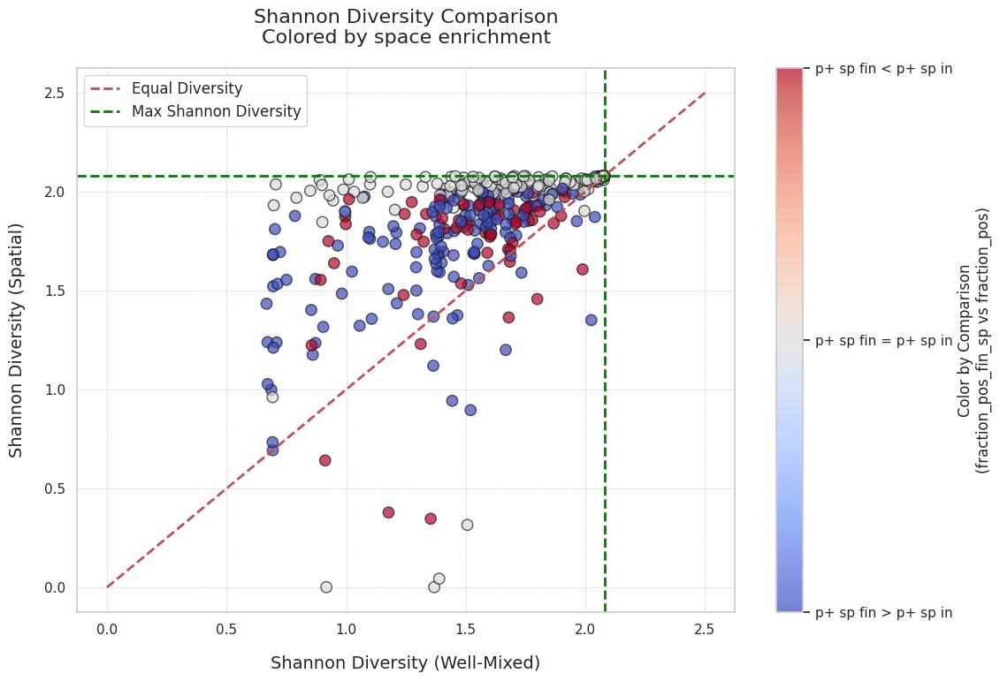

In [39]:
# Compare 'fraction_pos_fin_sp' and 'fraction_pos' to assign color labels
df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_sp'] > df_complete['fraction_pos'], 'blue', 
                                       np.where(df_complete['fraction_pos_fin_sp'] < df_complete['fraction_pos'], 'red', 'gray'))

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot with custom colors
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['color_label'].map({'blue': 0, 'gray': 0.5, 'red': 1}),  # Color based on the comparison
    cmap='coolwarm',               # Colormap for color encoding
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar for the custom colors (no need for the 'time' color bar now)
cbar = plt.colorbar(sc)
cbar.set_ticks([0, 0.5, 1])  # Set color bar ticks
cbar.set_ticklabels(['p+ sp fin > p+ sp in', 'p+ sp fin = p+ sp in', 'p+ sp fin < p+ sp in'])  # Set the labels
cbar.set_label('Color by Comparison\n(fraction_pos_fin_sp vs fraction_pos)', fontsize=12)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by space enrichment', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

/tmp/ipykernel_3909714/3491875370.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_wm'] > df_complete['fraction_pos'], 'blue',


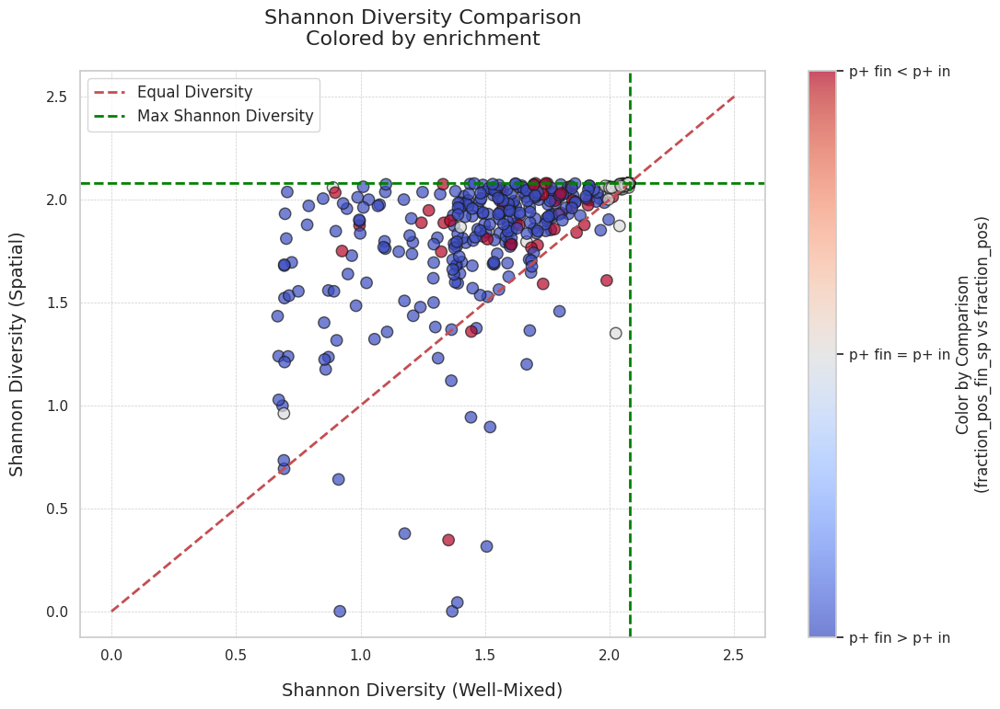

In [40]:
# Compare 'fraction_pos_fin_sp' and 'fraction_pos' to assign color labels
df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_wm'] > df_complete['fraction_pos'], 'blue', 
                                       np.where(df_complete['fraction_pos_fin_wm'] < df_complete['fraction_pos'], 'red', 'gray'))

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot with custom colors
sc = plt.scatter(
    df_complete['shannon'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['shannon_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['color_label'].map({'blue': 0, 'gray': 0.5, 'red': 1}),  # Color based on the comparison
    cmap='coolwarm',               # Colormap for color encoding
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar for the custom colors (no need for the 'time' color bar now)
cbar = plt.colorbar(sc)
cbar.set_ticks([0, 0.5, 1])  # Set color bar ticks
cbar.set_ticklabels(['p+ fin > p+ in', 'p+ fin = p+ in', 'p+ fin < p+ in'])  # Set the labels
cbar.set_label('Color by Comparison\n(fraction_pos_fin_sp vs fraction_pos)', fontsize=12)

# Diagonal line where shannon_wm == shannon_sp
plt.plot([0, 2.5], [0, 2.5], 'r--', linewidth=2, label='Equal Diversity')

# Maximum Shannon Diversity lines (vertical and horizontal at log(8))
plt.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
plt.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by enrichment', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

check if enrichment is the same in space and well_mixed

In [41]:
np.sum(df_complete['fraction_pos_fin_sp']>df_complete['fraction_pos'])

np.int64(143)

In [42]:
np.sum((df_complete['fraction_pos_fin_sp']>df_complete['fraction_pos']) & (df_complete['fraction_pos_fin_wm']>df_complete['fraction_pos']))

np.int64(135)

# Richness

/tmp/ipykernel_3909714/2205739709.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_wm'] > df_complete['fraction_pos'], 'blue',
/tmp/ipykernel_3909714/2205739709.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=12)


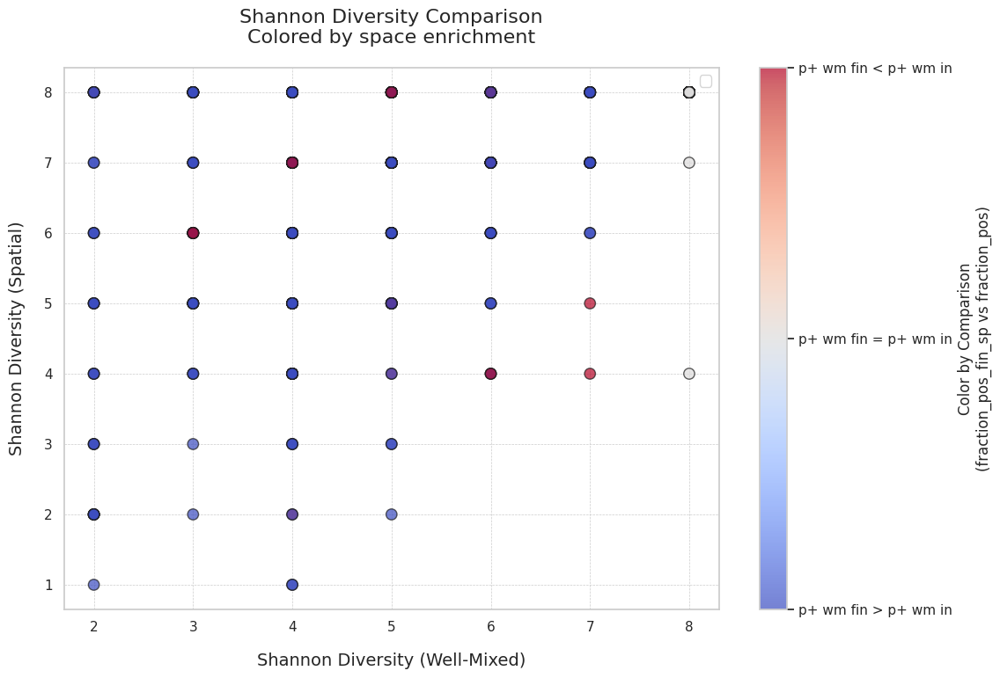

In [43]:
# Compare 'fraction_pos_fin_sp' and 'fraction_pos' to assign color labels
df_complete['color_label'] = np.where(df_complete['fraction_pos_fin_wm'] > df_complete['fraction_pos'], 'blue', 
                                       np.where(df_complete['fraction_pos_fin_wm'] < df_complete['fraction_pos'], 'red', 'gray'))

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot with custom colors
sc = plt.scatter(
    df_complete['richness'],       # x-axis: Shannon diversity in well-mixed environments
    df_complete['richness_sp'],    # y-axis: Shannon diversity in spatial environments
    c=df_complete['color_label'].map({'blue': 0, 'gray': 0.5, 'red': 1}),  # Color based on the comparison
    cmap='coolwarm',               # Colormap for color encoding
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar for the custom colors (no need for the 'time' color bar now)
cbar = plt.colorbar(sc)
cbar.set_ticks([0, 0.5, 1])  # Set color bar ticks
cbar.set_ticklabels(['p+ wm fin > p+ wm in', 'p+ wm fin = p+ wm in', 'p+ wm fin < p+ wm in'])  # Set the labels
cbar.set_label('Color by Comparison\n(fraction_pos_fin_sp vs fraction_pos)', fontsize=12)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by space enrichment', fontsize=16, pad=20)

# Add legend
plt.legend(fontsize=12)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

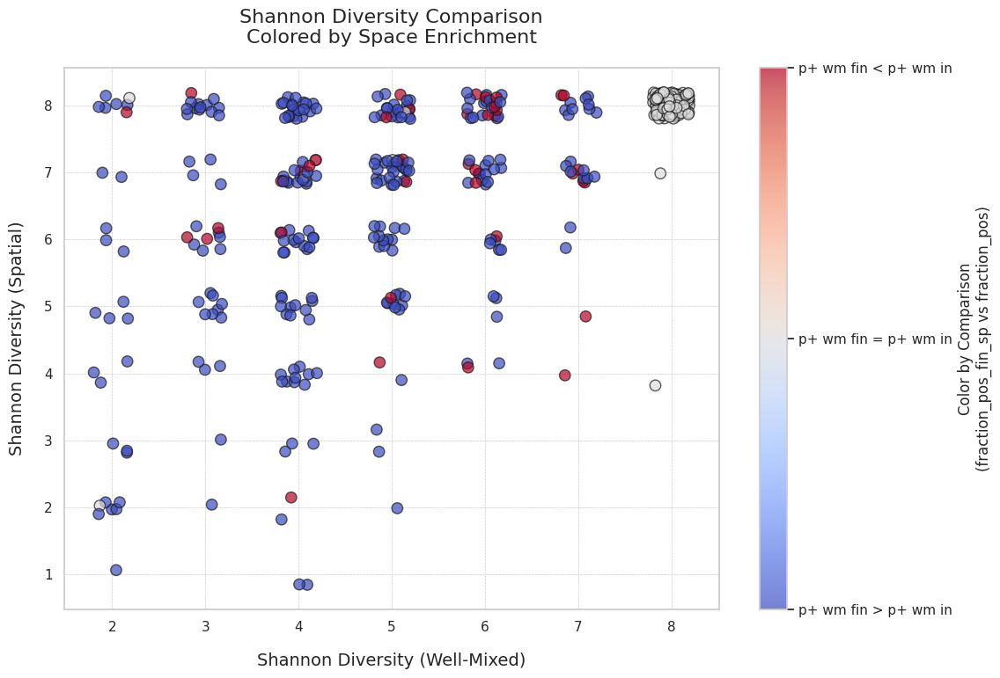

In [44]:
# Add jitter to the data
jitter_strength = 0.2  # Adjust the jitter strength as needed
x_jitter = df_complete['richness'] + np.random.uniform(-jitter_strength, jitter_strength, size=len(df_complete))
y_jitter = df_complete['richness_sp'] + np.random.uniform(-jitter_strength, jitter_strength, size=len(df_complete))

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot with custom colors and jittered points
sc = plt.scatter(
    x_jitter,                     # x-axis: Shannon diversity with jitter
    y_jitter,                     # y-axis: Shannon diversity with jitter
    c=df_complete['color_label'].map({'blue': 0, 'gray': 0.5, 'red': 1}),  # Color based on the comparison
    cmap='coolwarm',               # Colormap for color encoding
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar for the custom colors
cbar = plt.colorbar(sc)
cbar.set_ticks([0, 0.5, 1])  # Set color bar ticks
cbar.set_ticklabels(['p+ wm fin > p+ wm in', 'p+ wm fin = p+ wm in', 'p+ wm fin < p+ wm in'])  # Set the labels
cbar.set_label('Color by Comparison\n(fraction_pos_fin_sp vs fraction_pos)', fontsize=12)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by Space Enrichment', fontsize=16, pad=20)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()

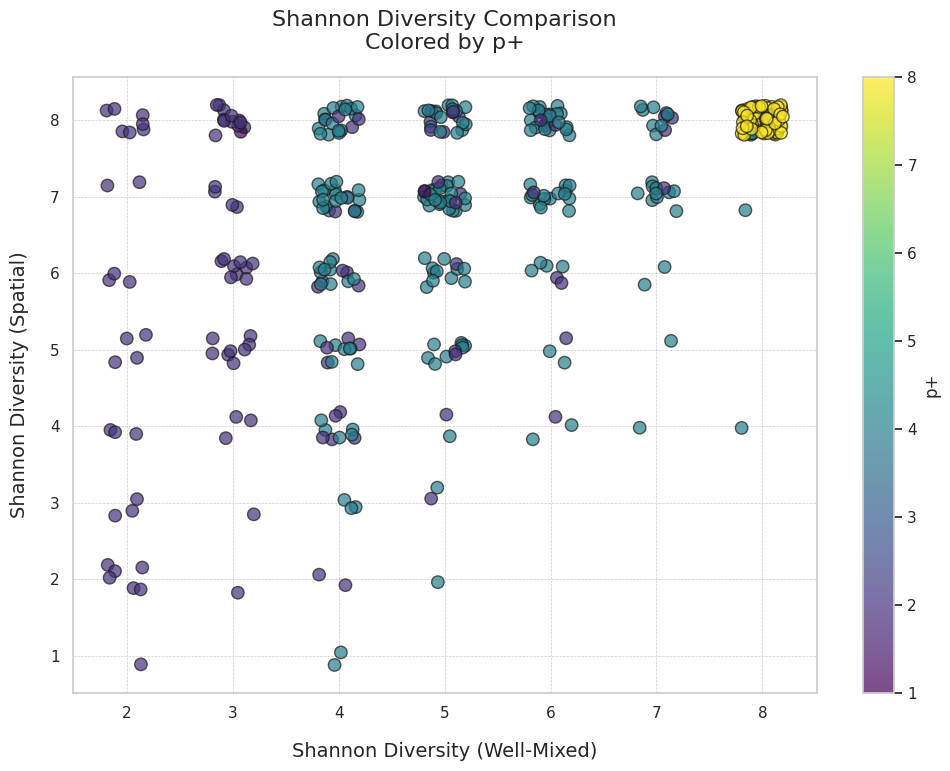

In [45]:
# Add jitter to the data
jitter_strength = 0.2  # Adjust the jitter strength as needed
x_jitter = df_complete['richness'] + np.random.uniform(-jitter_strength, jitter_strength, size=len(df_complete))
y_jitter = df_complete['richness_sp'] + np.random.uniform(-jitter_strength, jitter_strength, size=len(df_complete))

# Create the figure
plt.figure(figsize=(12, 8))

# Scatter plot with custom colors and jittered points
sc = plt.scatter(
    x_jitter,                     # x-axis: Shannon diversity with jitter
    y_jitter,                     # y-axis: Shannon diversity with jitter
    c=df_complete['n_supplied'],  # Color based on the comparison
    cmap='viridis',               # Colormap for color encoding
    s=80,                          # Size of the points
    edgecolor='k',                 # Add black edge to the dots for better visualization
    alpha=0.7                      # Transparency for better visualization
)

# Add a color bar for the custom colors
cbar = plt.colorbar(sc)
cbar.set_label('p+', fontsize=12)

# Labels and title with professional formatting
plt.xlabel('Shannon Diversity (Well-Mixed)', fontsize=14, labelpad=15)
plt.ylabel('Shannon Diversity (Spatial)', fontsize=14, labelpad=15)
plt.title('Shannon Diversity Comparison\nColored by p+', fontsize=16, pad=20)

# Customize the appearance of the gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show plot
plt.show()